<a href="https://colab.research.google.com/github/ChandraMouli2214/cs666student/blob/main/CS666_Assignment_7%2C_Mouli.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

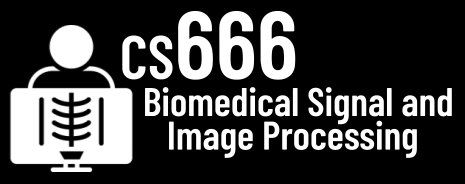
# Assignment 7

In [ ]:
# NAME:Chandra Mouli Cherukuri Visweswararao

In [ ]:
# In this assignment, we will explore the Imaging Data Commons,
# a data repository from the National Cancer Institute.

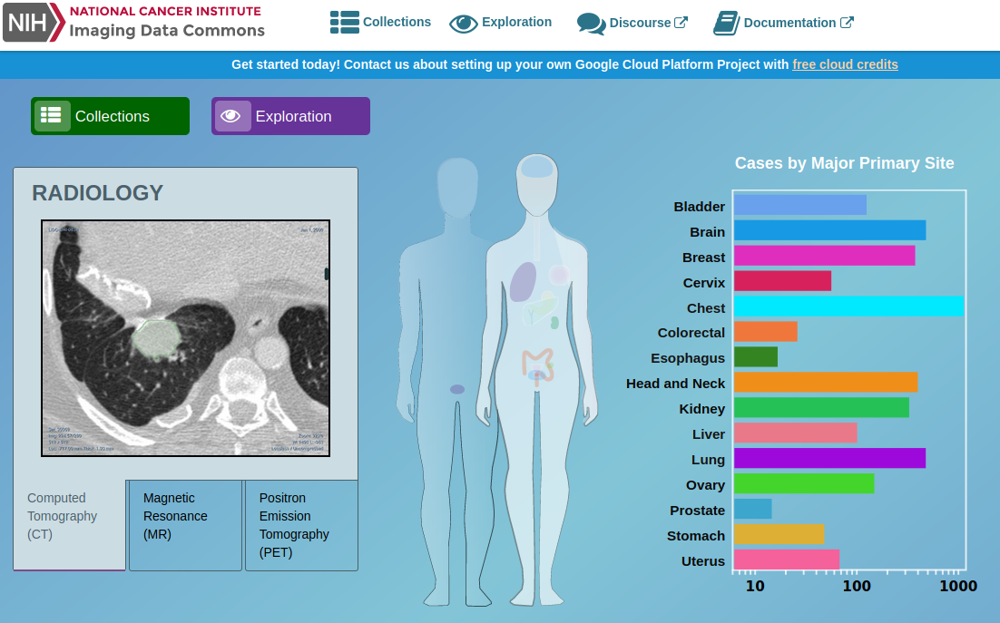

**Task 1**: Browse the IDC datasets and find a combined CT or MRI with PET! [10 Points]

In [ ]:
#
# Visit https://portal.imaging.datacommons.cancer.gov/ and find a dataset
# that includes structural imaging such as CT or MRI combined with a PET scan.
#
# You can start by selecting the type of a cancer case such as Bladder, Brain etc.
# Hint: Head and Neck include many PET scans.
#

In [ ]:
# TODO: Open the integrated OHIF viewer to view the data.
#
# 1) Select a collection, then a case, then a study in the IDC interface.
# 2) To open the OHIF viewer, click on the view icon.
#

In [ ]:
#
# TODO: https://viewer.imaging.datacommons.cancer.gov/viewer/1.3.6.1.4.1.14519.5.2.1.7009.2406.941409355639310066701665617488
#

In [ ]:
# 3) Paste a screenshot of the viewer after the data was loaded below.

TODO: Add screenshot of the viewer.
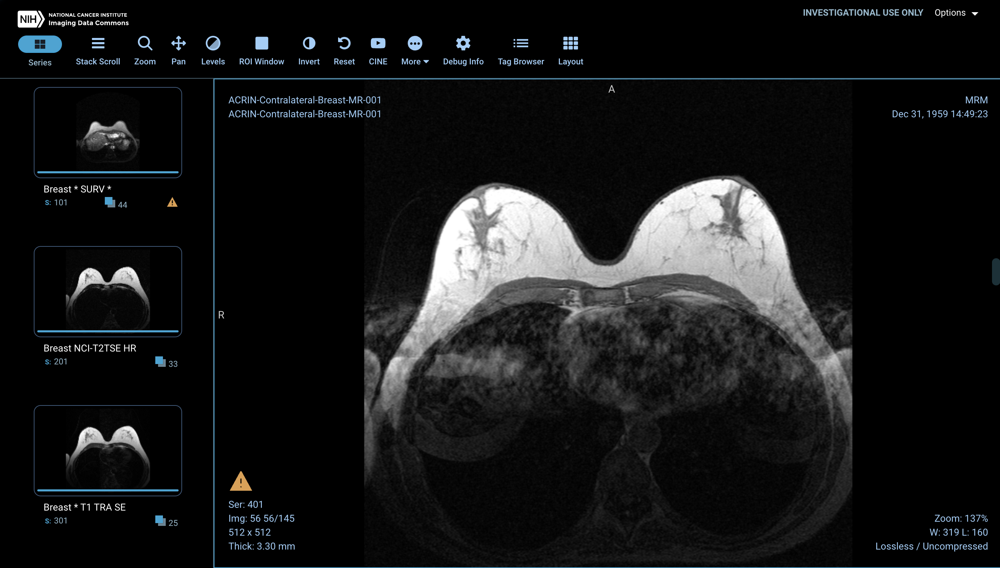

**Task 2**: Visualize structural and PET side-by-side! [20 Points]

In [ ]:
# In the OHIF viewer, please change the layout to show the structural image
# next to the PET scan.
#
# TODO: Use the LAYOUT functionality in the toolbar to switch to a 2-column layout.

In [ ]:
# TODO: Find the cancerous lesion.
#
# 1) Navigate through the PET image to find the cancerous lesion.

In [ ]:
# TODO: Sync the structural scan (CT or MR) to the PET scan with the lesion.
#
# Hint: The "Loc" label in the bottom left of both scans should roughly match.
# Hint 2: The Levels tool allows Window/Level adjustment to increase contrast.
#

In [ ]:
# TODO: Paste a screenshot showing the 2-column layout below.

TODO: Add your screenshot showing the cancerous lesion and structural scan side-by-side.
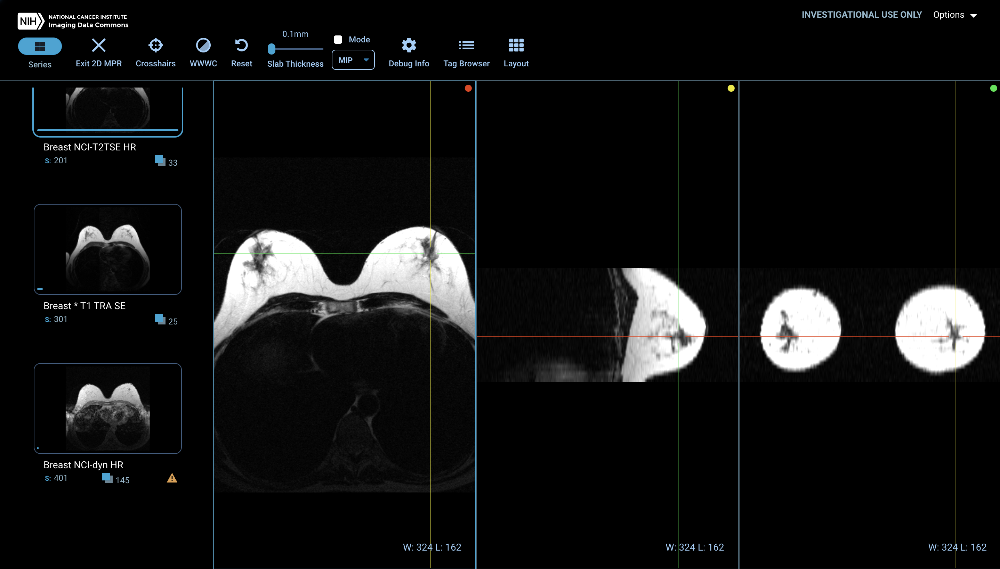

**Task 3**: Let's access the pixel data! [20 Points]

In [ ]:
#
# IMPORTANT: SWITCH BACK TO THE STANDARD LAYOUT (1-column) or RELOAD THE PAGE.
#
# AND: Visualize the CT/MRI scan rather than the PET scan for this task.
#
# We will now grab the pixel data of the currently displayed slice
# using the Javascript console.
#

In [ ]:
# 1) Open the Developer Tools of your browser and access the JS console.

In [ ]:
# 2) The following code allows to access the pixel data of the slice that
# is currently displayed.
#
#   element = cornerstone.getEnabledElements()[0];
#   pixels = element.image.getPixelData();
#

In [ ]:
# 3): What is the minimum pixel value of the current slice?
#
# Hint: There are multiple ways of doing this according to
# https://medium.com/coding-at-dawn/the-fastest-way-to-find-minimum-and-maximum-values-in-an-array-in-javascript-2511115f8621
#

In [ ]:
#
#
# TODO: YOUR CODE GOES HERE
#
#

minPixelValue = pixels.reduce(function(a, b) {
    return Math.min(a, b);
});

maxPixelValue = pixels.reduce(function(a, b) {
    return Math.max(a, b);
});

console.log('Min Pixel:', minPixelValue);
console.log('Max Pixel:', maxPixelValue);

In [ ]:
# TODO: 

# MINIMUM VALUE OF THE SLICE IS 0
# MAXIMUM VALUE OF THE SLICE IS 417

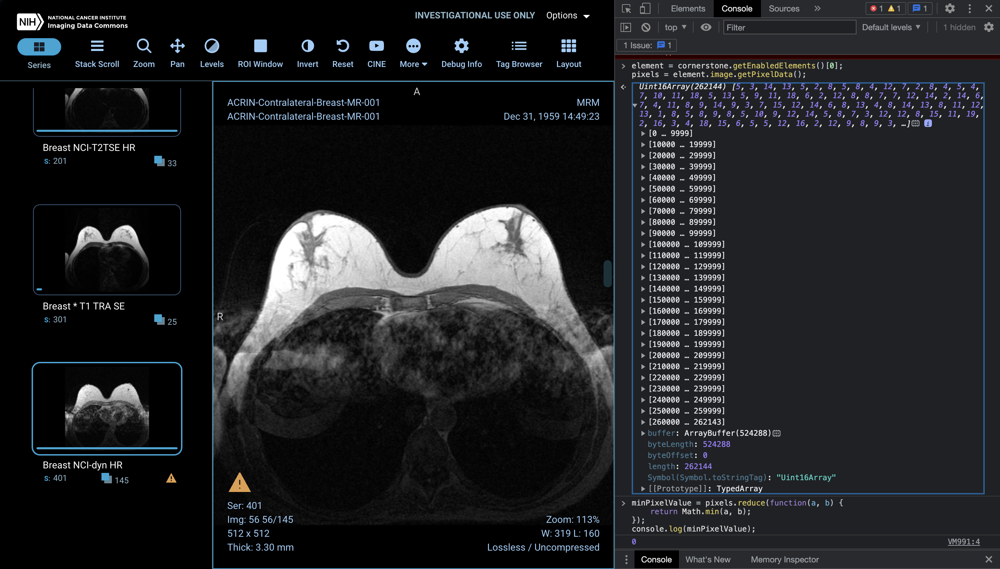

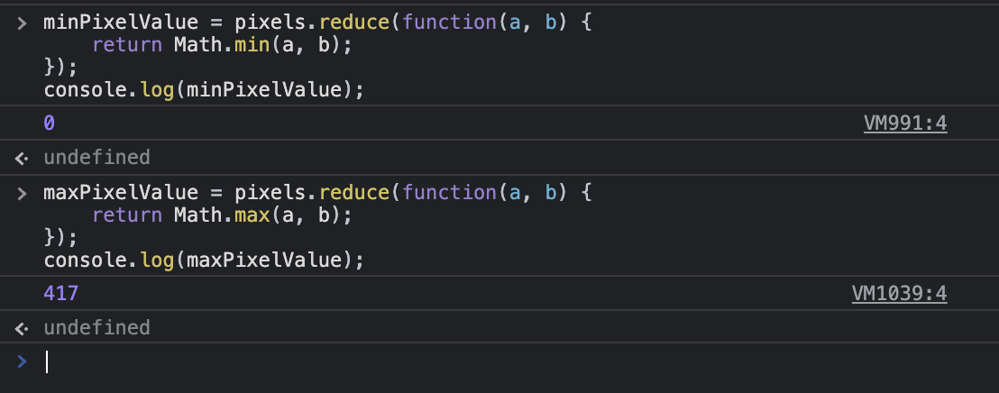

**Task 4**: Let's apply a 3x3 filter mask! [30 Points]

In [ ]:
# Here we will modify the pixel data!
#
# The following code allows you to set the pixels of the current slice.
#
#   pixels.set(new_pixels);
#
# Write code to APPLY A FILTER MASK to the pixels.
#
# Hint: You can use the following code to get the dimensions of the current slice.
#   w = element.image.width;
#   h = element.image.height;
#
# You can decide which filter mask to apply (e.g., Sobel, Gaussian blur, edge detection..).
#
# After setting new pixel values, you can re-draw/re-render the current slice with this command:
#
#   cornerstone.renderGrayscaleImage(element, true);
#

In [ ]:
#
#
# TODO: YOUR CODE GOES HERE
#
#
// Grab the image dimensions
w = element.image.width;
h = element.image.height;

// Define Sobel kernels
let Gx = [[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]];
let Gy = [[-1, -2, -1], [0, 0, 0], [1, 2, 1]];

// Apply Sobel operator
let new_pixels = new Uint8Array(w * h);
for (let y = 1; y < h - 1; y++) {
  for (let x = 1; x < w - 1; x++) {
    let px = (y * w) + x; // Current pixel index
    let sumX = 0;
    let sumY = 0;

    // Apply kernels to surrounding pixels
    for (let ky = -1; ky <= 1; ky++) {
      for (let kx = -1; kx <= 1; kx++) {
        let p = ((y + ky) * w) + (x + kx); // Neighboring pixel index
        sumX += Gx[ky + 1][kx + 1] * pixels[p];
        sumY += Gy[ky + 1][kx + 1] * pixels[p];
      }
    }

    // Approximate gradient magnitude
    new_pixels[px] = Math.sqrt((sumX * sumX) + (sumY * sumY)) | 0;
  }
}

// Set new pixel values and redraw the image
pixels.set(new_pixels);
cornerstone.renderGrayscaleImage(element, true);

TODO: Add Screenshot of the filtered slice.

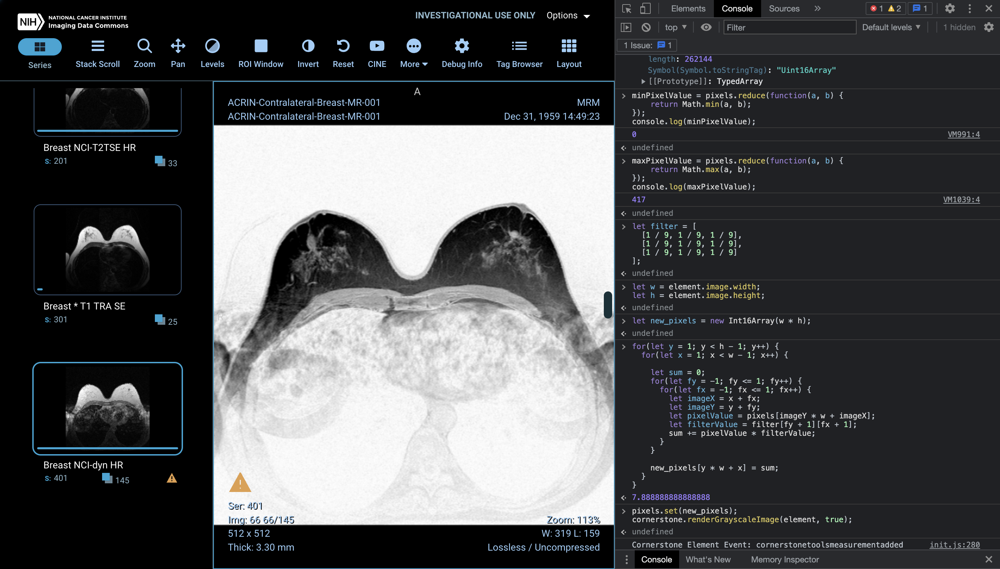

Blurred Image

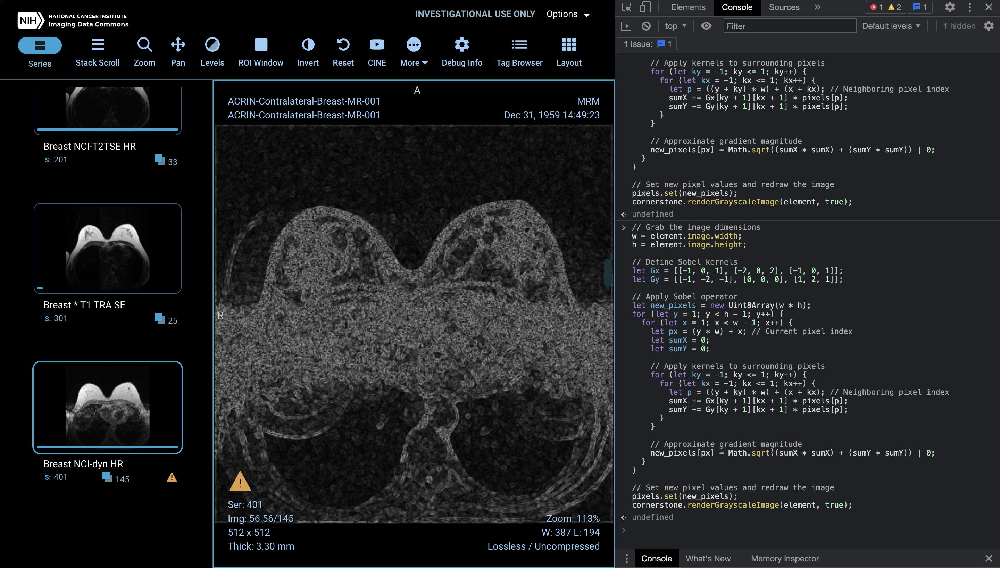

**Task 5**: Use the Segment Anything model to annotate the scan. [20 Points]

In [ ]:
#
# Now we will use the bookmarklet to run Meta's Segment Anything model on the data.
#
# 1) Visit https://cs666.org/sam/ and install the bookmarklet.
#
# 2) Run the model on a structure of your choice.
#    HINT: The video shows how to do it https://www.youtube.com/watch?v=2kxrqQfjsQw
#
# 3) Take a screenshot of the result.
#

TODO: Add Screenshot of the segmented slice.
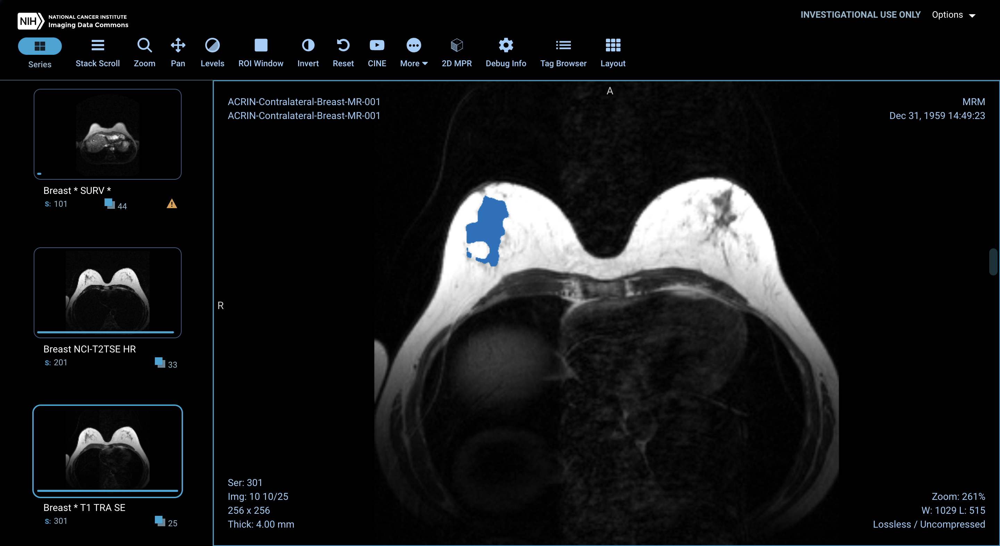

In [ ]:
#
# 4) Now, please study the code of the bookmarklet.
#    See https://gist.github.com/haehn/bbec8cf8442adea5bb10c08d9c3cc13f
#
#    TODO: What is the main difference between processing with the bookmarklet
#          versus the kernel mask filtering from above in terms of accessing
#          the pixels?
#

Now, regarding the comparison between processing with the bookmarklet and the kernel mask filtering from the previous task:

The bookmarklet's source code shows that it accesses the image data in a different way compared to the kernel mask filtering. While both methods retrieve and manipulate pixel data, the main difference lies in how and where the processing takes place.

In the kernel mask filtering, the image processing is performed directly on the client side (in your browser). The pixel data is accessed through the Cornerstone library, manipulated using JavaScript directly in the browser's console, and the modified image is displayed in the same environment.

On the other hand, the bookmarklet interacts with the Meta's Segment Anything model, which does the bulk of its processing on a server side. The bookmarklet sends the image data to the server, where the model processes it, and the result is then returned back to the client. This allows complex machine learning-based processing, which would not be practical (or sometimes even possible) to perform in the browser environment.

In conclusion, the kernel mask filtering operates entirely in your local browser, while the bookmarklet is a bridge between your browser and a server-side machine learning model.

**Bonus 1**: Create a Segment Anything bookmarklet for NiiVue.js-based installations. [33 Points]

In [ ]:
#
# Similar to the code from Task 5, please create a bookmarklet (JS injection) 
# for a NiiVue.js-based visualization such as: https://mpsych.github.io/CACTAS/
#
# HINT: nv.drawSelectionBox([x,y,w,h]) draws a selection box and here is a related
#       github issue: https://github.com/niivue/niivue/issues/596
#
# HINT2: You will want to hide the blue orientation lines before grabbing the
#        canvas pixels.
#          nv.setCrosshairColor([0, 0, 0, 0]);
#          nv.opts.crosshairWidth = 0.;
#          nv.updateGLVolume();
#
# HINT3: The CACTAS repo has a lot of useful NiiVue.js code snippets
#        https://github.com/mpsych/cactas
#

javascript:(function() {
    let nv = window.nv;

    // Hide the blue orientation lines
    nv.setCrosshairColor([0, 0, 0, 0]);
    nv.opts.crosshairWidth = 0.;
    nv.updateGLVolume();

    // Grab the canvas and get its pixel data
    let canvas = document.querySelector('canvas');
    let context = canvas.getContext('2d');
    let imageData = context.getImageData(0, 0, canvas.width, canvas.height);
    let pixels = imageData.data;
    nv.drawSelectionBox([10, 10, 100, 100]);
})();

**Bonus 2**: Plugin your NiiVue.js bookmarklet on OpenNeuro.org. [Summer Job]

In [ ]:
#
# Integrate the Segment Anything bookmarklet with OpenNeuro.org, for example here:
# https://openneuro.org/datasets/ds004513/versions/1.0.2/file-display/sub-s033:ses-open:anat:sub-s033_ses-open_T1w.nii.gz
#
# And here is a related Github issue: https://github.com/OpenNeuroOrg/openneuro/issues/2815
#
# STRETCH GOALS TO STRENGTHEN YOUR APPLICATION:
#  1. Run on pixel data rather than canvas imagedata.
#  2. Run in 3D!
#

In [ ]:
#Collab with Rithvik Reddy Paluchani
# THANK YOU!!!
#
#       .--..--..--..--..--..--.
#     .' \  (`._   (_)     _   \
#   .'    |  '._)         (_)  |
#   \ _.')\      .----..---.   /
#   |(_.'  |    /    .-\-.  \  |
#   \     0|    |   ( O| O) | o|
#    |  _  |  .--.____.'._.-.  |
#    \ (_) | o         -` .-`  |
#     |    \   |`-._ _ _ _ _\ /
#     \    |   |  `. |_||_|   |
#     | o  |    \_      \     |     -.   .-.
#     |.-.  \     `--..-'   O |     `.`-' .'
#   _.'  .' |     `-.-'      /-.__   ' .-'
# .' `-.` '.|='=.='=.='=.='=|._/_ `-'.'
# `-._  `.  |________/\_____|    `-.'
#    .'   ).| '=' '='\/ '=' |
#    `._.`  '---------------'
#            //___\   //___\
#              ||       ||
#     LGB      ||_.-.   ||_.-.
#             (_.--__) (_.--__)
#
#